In [1]:
# Folium for visualization
#!pip install folium

In [225]:
import os
import sys

import urllib, json, requests
from bs4 import BeautifulSoup
from glob import glob

import geopandas as gpd
import pandas as pd

from shapely.geometry import LineString
from shapely.ops import cascaded_union

import folium
from folium.plugins import Fullscreen, MarkerCluster

from matplotlib import pyplot as plt 
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [74]:
# NOAA file download URL
NOAA_BASE_URL = 'https://www.nhc.noaa.gov/gis/'

In [75]:
# Colors for the hurricane track
colors = {
    'Subtropical Depression': 'yellow',
    'Tropical Depression': 'yellow',
    'Tropical Storm': 'orange',
    'Subtropical Storm': 'orange',
    'Hurricane': 'red',
    'Major Hurricane': 'crimson'
}

### Helper methods to scrape NOAA website and download hurricane GIS files

In [5]:
def get_links(hurricane_id, file_format):
    noaa_request = requests.get(NOAA_BASE_URL + 'archive_forecast_results.php?id=' + hurricane_id)

    soup = BeautifulSoup(noaa_request.content, 'html.parser')

    # Grab all links on web-page that have href attribute 
    links = soup.findAll('a', href=True)  
  
    # Filter the link sending with .mp4  
    hurricane_links = [NOAA_BASE_URL + link['href'] for link in links if file_format in link['href']]  
  
    return hurricane_links

def download_file(link, folder):
    file = requests.get(link).content
    name = link.split('/')[-1]
    save_path = os.path.join(folder, name)

    print("Saving file:", save_path)
    with open(save_path, 'wb') as fp:
        fp.write(file)    
        
def download_files(hurricane_id, file_format, folder):
    # Get all relevant download links
    links = get_links(hurricane_id, file_format)

    # Download the files
    for link in set(links):
        download_file(link, folder)

### Helper method to get warning cones and track points

In [76]:
def get_cones_and_points(hurricane_id, hurricane_year, file_format, folder):
    # Adapted from https://gist.github.com/rsignell-usgs/b02b326cc7b0db53bea01ccff5b31ff4
    cones, points = [], []

    for fname in sorted(glob(os.path.join(folder, '{}_*.zip'.format(file_format)))):
        number = os.path.splitext(os.path.split(fname)[-1])[0].split('_')[-1]
        pgn = gpd.read_file(
            '/{}-{}_5day_pgn.shp'.format(hurricane_id + hurricane_year, number),
            vfs='zip://{}'.format(fname)
        )
        cones.append(pgn)

        pts = gpd.read_file(
            '/{}-{}_5day_pts.shp'.format(hurricane_id + hurricane_year, number),
            vfs='zip://{}'.format(fname)
        )
        # Grab only the first point
        points.append(pts.iloc[0])

    return (cones, points, pts)

### Visualization with Folium

In [77]:
def map_hurricane(cones, points, latest_points, highlight):
    # Combine the last_cone and the track
    last_cone = cones[-1]['geometry'].iloc[0]
    track = LineString([point['geometry'] for point in points])
    polygon = cascaded_union([last_cone, track])

    # Derive bounding box from the track and the latest prediction cone.
    bbox = polygon.buffer(2).bounds

    # Get the lat/long
    lon = track.centroid.x
    lat = track.centroid.y

    m = folium.Map(location=[lat, lon], tiles='OpenStreetMap', zoom_start=4)

    Fullscreen(position='topright', force_separate_button=True).add_to(m)

    marker_cluster0 = MarkerCluster(name='Observations')
    marker_cluster1 = MarkerCluster(name='Past predictions')

    marker_cluster0.add_to(m)
    marker_cluster1.add_to(m)

    def style_function(feature):
        return {
            'fillOpacity': 0,
            'color': 'black',
            'stroke': 1,
            'weight': 0.5,
            'opacity': 0.2,
        }

    # Highlight cone prediction
    latest = cones[highlight]
    folium.GeoJson(
        data=latest.__geo_interface__,
        name='Cone prediction as of {}'.format(latest['ADVDATE'].values[0]),
    ).add_to(m)

    # Past cone predictions
    for cone in cones[:-1]:
        folium.GeoJson(
            data=cone.__geo_interface__,
            style_function=style_function,
        ).add_to(marker_cluster1)

    # Latest points prediction
    for k, row in latest_points.iterrows():
        date = row['FLDATELBL']
        hclass = row['TCDVLP']
        location = row['LAT'], row['LON']
        popup = '{}<br>{}'.format(date, hclass)
        folium.CircleMarker(
            location=location,
            radius=10,
            fill=True,
            color=colors[hclass],
            popup=popup,
        ).add_to(m)

    # All the points along the track
    for point in points:
        date = point['FLDATELBL']
        hclass = point['TCDVLP']
        location = point['LAT'], point['LON']
        popup = '{}<br>{}'.format(location, hclass)
        folium.CircleMarker(
            location=location,
            radius=5,
            fill=True,
            color=colors[hclass],
            popup=popup,
        ).add_to(m)

    return m

In [80]:
def visualize_hurricane(hurricane_id, hurricane_year, file_format, highlight):
    # Get cones and points
    cones, points, latest_points = get_cones_and_points(hurricane_id=hurricane_id, hurricane_year=hurricane_year, file_format=file_format, folder=folder)
    
    return map_hurricane(cones=cones, points=points, latest_points=latest_points, highlight=highlight)

In [140]:
def get_counties(hurricane_id, hurricane_year, file_format, folder):    
    points = []
    for fname in sorted(glob(os.path.join(folder, '{}_*.zip'.format(file_format)))):
        number = os.path.splitext(os.path.split(fname)[-1])[0].split('_')[-1]       
        pts = gpd.read_file(
            '/{}-{}_5day_pts.shp'.format(hurricane_id + hurricane_year, number),
            vfs='zip://{}'.format(fname)
        )        
        points.append(pts)
    
    lat_lon_list = []
    for point in points:
        lat_lon_list.extend(list(zip(point.LAT, point.LON)))
        
    # Lookup the points for lat/long conversion to county names
    counties = []
    for lat_lon in lat_lon_list:
        with urllib.request.urlopen('https://geo.fcc.gov/api/census/area?lat=' + str(lat_lon[0]) + '&lon=' + str(lat_lon[1]) + '&format=json') as url:
            data = json.loads(url.read().decode())    
            if (len(data['results']) > 0):
                result = data['results'][0]
                counties.append(
                    {'block_fips'  : result['block_fips'],
                     'county_fips' : result['county_fips'],
                     'county_name' : result['county_name'],
                     'state_fips'  : result['state_fips'],
                     'state_code'  : result['state_code']
                    }) 
    return counties

In [238]:
def visualize_counties(hurricane_id, hurricane_year, hurricane_name, file_format, folder, state_code, census_shapefile):
    # Get the counties along the points
    hurricane_counties_df = pd.DataFrame.from_dict(get_counties(hurricane_id=hurricane_id, 
                                                                hurricane_year=hurricane_year, 
                                                                file_format=file_format, folder=folder))
    
    # Drop duplicates, include counties with matching state_code,
    # add hurricane_path indicator
    hurricane_counties_df.drop_duplicates(inplace=True)
    hurricane_counties_df['COUNTYFP'] = hurricane_counties_df['county_fips'].str[2:]
    hurricane_counties_df = hurricane_counties_df.loc[hurricane_counties_df['state_code'] == state_code]
    hurricane_counties_df['hurricane_path'] = 1
    
    # Load the county shapefile
    census_blocks = gpd.read_file(census_shapefile)
    counties = census_blocks.dissolve(by=PR_census_blocks.columns[1], aggfunc='first')
    
    # Merge with hurricane_counties_df
    counties = counties.merge(hurricane_counties_df.loc[:, ['COUNTYFP', 'hurricane_path']], how='left', on='COUNTYFP')
    counties['hurricane_path'].fillna(0, inplace=True)   
    
    # Visualize
    fig, ax = plt.subplots(figsize=(15, 10))
    counties.plot(column='hurricane_path', ax=ax, legend=False, cmap='Reds')
    ax.set_title('Counties along Hurricane ' + hurricane_name + ' track', fontsize=20)
    ax.axis('off')
    plt.tight_layout()    

### Find Hurricane Idemtifiers here: https://www.nhc.noaa.gov/gis/archive_forecast.php?year=2017

### Visualize Hurricane Maria

In [239]:
# Hurricane Maria Identifier
hurricane_id = 'al15' 
hurricane_year = '2017'
    
# Generate appropriate file format
file_format = '{}_5day'.format(hurricane_id + hurricane_year)

# Create the download folder if necessary
folder = os.path.abspath(os.path.join('../data/hurricane-gis', file_format))
if not os.path.exists(folder): os.makedirs(folder)

# Download all files
#download_files(hurricane_id=hurricane_id, file_format=file_format, folder=folder)

In [147]:
hurricane_map = visualize_hurricane(hurricane_id=hurricane_id, hurricane_year=hurricane_year, file_format=file_format, highlight=30)
hurricane_map

/Users/nitinserro/anaconda3/lib/python3.6/site-packages/fiona/env.py:400: FionaDeprecationWarning: The vfs keyword argument is deprecated. Instead, pass a URL that uses a zip or tar (for example) scheme.
  return f(*args, **kwargs)


### Counties on the Hurricane Path

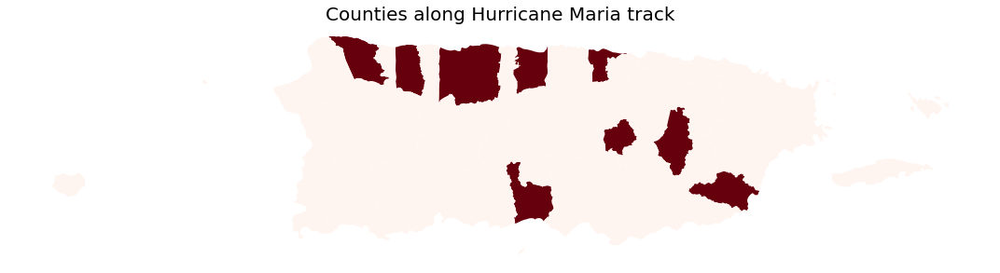

In [240]:
visualize_counties(hurricane_id=hurricane_id, hurricane_year=hurricane_year, 
                   hurricane_name='Maria', file_format=file_format, folder=folder, state_code='PR',
                   census_shapefile='../data/census-tract/shapefiles/cb_2017_72_tract_500k.shp')

### Visualize Hurricane Irma

In [241]:
# Hurricane Irma Identifier
hurricane_id = 'al11' 
hurricane_year = '2017'

# Generate appropriate file format
file_format = '{}_5day'.format(hurricane_id + hurricane_year)

# Create the download folder if necessary
folder = os.path.abspath(os.path.join('../data/hurricane-gis', file_format))
if not os.path.exists(folder): os.makedirs(folder)

# Download all files
#download_files(hurricane_id=hurricane_id, file_format=file_format, folder=folder)

In [154]:
hurricane_map = visualize_hurricane(hurricane_id=hurricane_id, hurricane_year=hurricane_year, file_format=file_format, highlight=30)
hurricane_map

/Users/nitinserro/anaconda3/lib/python3.6/site-packages/fiona/env.py:400: FionaDeprecationWarning: The vfs keyword argument is deprecated. Instead, pass a URL that uses a zip or tar (for example) scheme.
  return f(*args, **kwargs)


/Users/nitinserro/anaconda3/lib/python3.6/site-packages/fiona/env.py:400: FionaDeprecationWarning: The vfs keyword argument is deprecated. Instead, pass a URL that uses a zip or tar (for example) scheme.
  return f(*args, **kwargs)


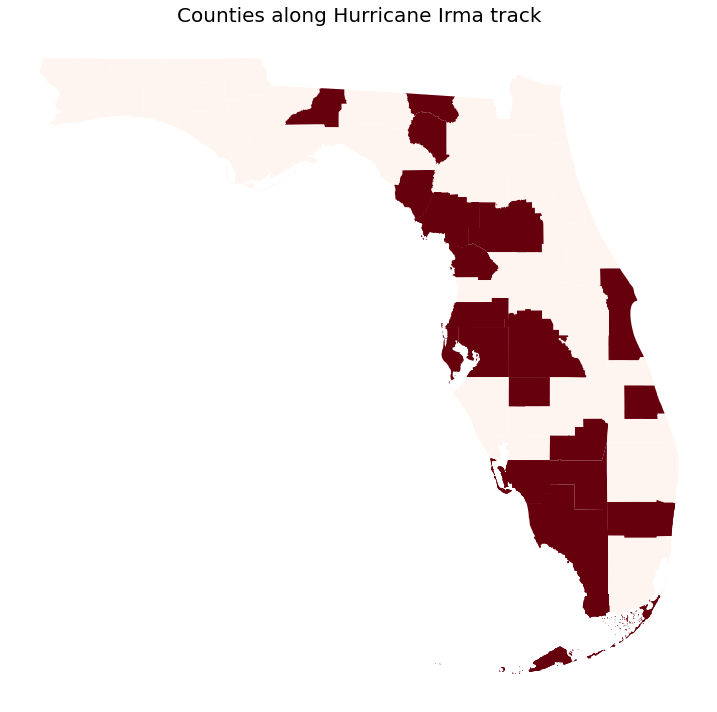

In [242]:
visualize_counties(hurricane_id=hurricane_id, hurricane_year=hurricane_year, 
                   hurricane_name='Irma', file_format=file_format, folder=folder, state_code='FL',
                   census_shapefile='../data/census-tract/shapefiles/cb_2017_12_tract_500k.shp')

### Visualize Hurricane Harvey

In [243]:
# Hurricane Irma Identifier
hurricane_id = 'al09' 
hurricane_year = '2017'

# Generate appropriate file format
file_format = '{}_5day'.format(hurricane_id + hurricane_year)

# Create the download folder if necessary
folder = os.path.abspath(os.path.join('../data/hurricane-gis', file_format))
if not os.path.exists(folder): os.makedirs(folder)

# Download all files
#download_files(hurricane_id=hurricane_id, file_format=file_format, folder=folder)

# Get cones and points
cones, points, latest_points = get_cones_and_points(hurricane_id=hurricane_id, hurricane_year=hurricane_year, file_format=file_format, folder=folder)

/Users/nitinserro/anaconda3/lib/python3.6/site-packages/fiona/env.py:400: FionaDeprecationWarning: The vfs keyword argument is deprecated. Instead, pass a URL that uses a zip or tar (for example) scheme.
  return f(*args, **kwargs)


In [157]:
hurricane_map = visualize_hurricane(hurricane_id=hurricane_id, hurricane_year=hurricane_year, file_format=file_format, highlight=30)
hurricane_map

/Users/nitinserro/anaconda3/lib/python3.6/site-packages/fiona/env.py:400: FionaDeprecationWarning: The vfs keyword argument is deprecated. Instead, pass a URL that uses a zip or tar (for example) scheme.
  return f(*args, **kwargs)


/Users/nitinserro/anaconda3/lib/python3.6/site-packages/fiona/env.py:400: FionaDeprecationWarning: The vfs keyword argument is deprecated. Instead, pass a URL that uses a zip or tar (for example) scheme.
  return f(*args, **kwargs)


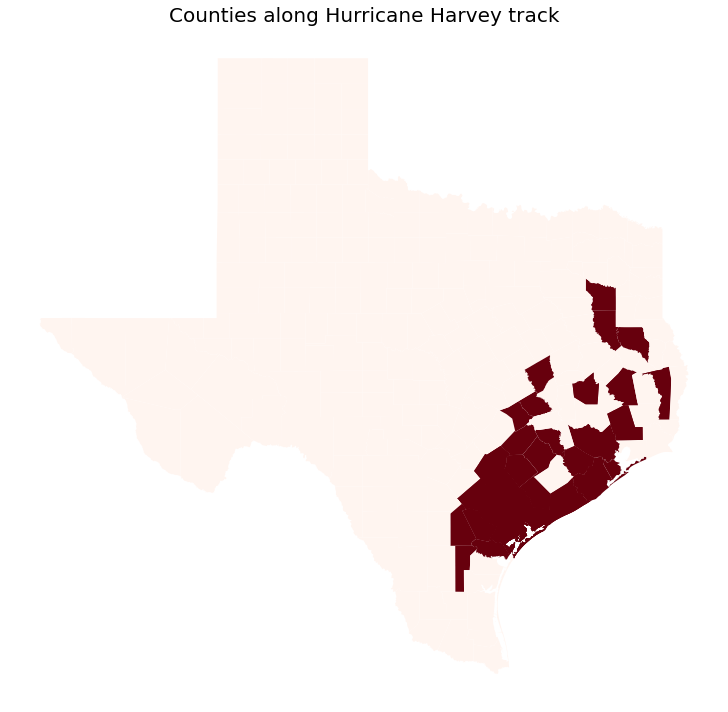

In [245]:
visualize_counties(hurricane_id=hurricane_id, hurricane_year=hurricane_year, 
                   hurricane_name='Harvey', file_format=file_format, folder=folder, state_code='TX',
                   census_shapefile='../data/census-tract/shapefiles/cb_2017_48_tract_500k.shp')